In [1]:
# python imports
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import corner
import astropy as ap
from astropy.io import fits
import astropy.io.fits as pyfits
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)
import pandas as pd
import math
import statistics
import scipy.ndimage as ndimage

# lenstronomy imports
from lenstronomy.Util import util
import lenstronomy.Util.kernel_util as kernel_util
import lenstronomy.Plots.plot_util as plot_util
from lenstronomy.PointSource.point_source import PointSource
from lenstronomy.Data.imaging_data import ImageData
from lenstronomy.Data.psf import PSF
from lenstronomy.Plots.model_plot import ModelPlot
from lenstronomy.Plots import chain_plot
from lenstronomy.Workflow.fitting_sequence import FittingSequence
from lenstronomy.Util import mask_util
from lenstronomy.ImSim.image_linear_solve import ImageLinearFit

In [2]:
# define some useful functions

def get_data(filename, coadd_id):  
    """Input filename and coadd_id returns fwhm of g,r,i bands and image data"""
    hdu_list = fits.open(filename)
    data = pd.DataFrame(hdu_list[2].data) # get dataframe data
    image = hdu_list['IMAGE'].data # get image data
    hdu_list.close() # close
    return data, image

def plot_image(image_array):
    """Input: image array, Output: plot of image"""
    fig, ax = plt.subplots()
    ax.imshow(image_array, origin = 'lower')    
    
    plt.show()
    plt.close()

def approx_theta_E(center_x, center_y, x_images, y_images): 
    """Input: Lens position (center_x, center_y) and image positions, output: estimated theta_E"""
    d=[]
    for i in range(0, len(x_images)):
        x=float(x_images[i])
        y=float(y_images[i])

        x=center_x-x
        y=center_y-y
        dist=math.sqrt(x**2+y**2)
        d.append(dist)

    theta_E = statistics.mean(d)

    print(f"'Estimated theta_E': {round(theta_E,2)}")
    return theta_E

In [ ]:
image=get_data(filename, 1325853948)
plot_image()

In [3]:
# set filename
filepath = '/Users/gilliancartwright/Desktop/DES data/' # my personal file path
filename = filepath + 'Rob_candidates.fits'

# show data table for reference
hdu_list = fits.open(filepath+'Rob_candidates.fits')
data = pd.DataFrame(hdu_list[2].data)
hdu_list.close()
#print(data.columns) # view all column names
data.head(3)


,COADD_OBJECT_ID,TILENAME,HPIX_16384,HPIX_4096,DNF_ZMEAN_SOF,RA,DEC,FLUX_RADIUS_G,FLUX_RADIUS_R,FLUX_RADIUS_I,...,FWHM_WMEAN_G,FWHM_WMEAN_R,FWHM_WMEAN_I,FWHM_WMEAN_Z,SKYBRITE_WMEAN_G,SKYBRITE_WMEAN_R,SKYBRITE_WMEAN_I,SKYBRITE_WMEAN_Z,NAME,NAME_FOLDER
0,1400263522,DES0336-2915,2354916223,147182263,0.938449,53.898900,-28.912203,3.962615,4.879757,4.983489,...,1.09654,0.943639,0.817035,0.899360,390.652008,947.728027,3299.189941,7099.970215,DES-691022126,DES0336-2915
1,1325853948,DES0242-0041,1163420627,72713789,0.006323,40.969310,-0.619002,10.245866,10.665524,11.179090,...,1.09442,0.956736,0.894366,0.889644,459.313995,1283.849976,3451.110107,8414.360352,DES-701263907,DES0242-0041
2,1087262176,DES0038-4414,2318857161,144928572,0.545765,10.155908,-44.437518,5.865641,5.180269,5.163048,...,1.28928,1.035290,1.025070,0.777657,406.477997,1063.030029,2966.409912,8586.750000,DES-699919273,DES0038-4414


In [4]:
# DES camera specifics
background_rms = 7.  # background noise per pixel 
exp_time = 90.  # exposure time 
numPix = 46 # number of pixels in image
deltaPix = 0.2637  # pixel size in arcsec
psf_type = 'GAUSSIAN' # psf model choice, 'GAUSSIAN', 'PIXEL'

In [8]:
### MODEL
def model(coadd_id, kwargs_lens_initial, kwargs_lens_light_initial, kwargs_source_initial,
          x_images, y_images, mask_list):
    """ 
    INPUT: coadd_id of image, initial lens model and light parameters, 
    list of x coords and y coords of images, 
    lists of image amplitudes for g,r,i bands,
    OPTIONAL: mask list
    
    OUTPUT: RGB image, observed image, reconstructed image, residuals plot, 
    and results of PSO and MCMC fitting
    
    """
    ## Image data
    data, image = get_data(filename, coadd_id)
    row = data[data['COADD_OBJECT_ID'] == coadd_id].index[0]

    g = image[row,0,:,:]
    r = image[row,1,:,:]
    i = image[row,2,:,:]
    
    fwhm_g = data.iloc[row,27]
    fwhm_r = data.iloc[row,28]
    fwhm_i = data.iloc[row,29] 
    
    # set models to use
    lens_model_list = ['SIE'] # not using SHEAR because it is too degenerate with model
    source_model_list = ['SERSIC_ELLIPSE'] 
    lens_light_model_list = ['SERSIC_ELLIPSE']
    point_source_list = ['LENSED_POSITION'] # input for point source is image positions, not source position


    
    # generate the coordinate grid and image properties
    ra_grid, dec_grid, ra_at_xy_0, dec_at_xy_0, _, _, Mpix2coord, _ = util.make_grid_with_coordtransform(numPix=numPix, deltapix=deltaPix, center_ra=0, center_dec=0, subgrid_res=1, inverse=False)
    
    # generate image data for each band
    kwargs_data_g = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord,  # translate between pixels and RA, DEC
               'image_data': g, # 2d data vector of band image
                    }  
    
    kwargs_data_r = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord,  
               'image_data': r,
                    }  
    
    kwargs_data_i = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord, 
               'image_data': i,
                    } 
    if psf_type=='GAUSSIAN':
        # Gauss PSF:
        kwargs_psf_g = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_g, 'pixel_size': deltaPix, 'truncation': 5}
        kwargs_psf_r = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_r, 'pixel_size': deltaPix, 'truncation': 5}
        kwargs_psf_i = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_i, 'pixel_size': deltaPix, 'truncation': 5}

        psf_g = PSF(**kwargs_psf_g)
        psf_r = PSF(**kwargs_psf_r)
        psf_i = PSF(**kwargs_psf_i)

        kernel_g = psf_g.kernel_point_source
        kernel_r = psf_r.kernel_point_source
        kernel_i = psf_i.kernel_point_source

        error_map_g=psf_g.psf_error_map
        error_map_r=psf_r.psf_error_map
        error_map_i=psf_i.psf_error_map


        kwargs_psf_g = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_g, 'kernel_point_source': kernel_g, 'psf_error_map': error_map_g}
        kwargs_psf_r = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_r, 'kernel_point_source': kernel_r, 'psf_error_map': error_map_r}
        kwargs_psf_i = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_i, 'kernel_point_source': kernel_i, 'psf_error_map': error_map_i}
    elif psf_type=='PIXEL':
        # Pixel PSF:
        psf_filename=filepath+'psf_example.fits'
        kernel = pyfits.getdata(psf_filename)
        kernel_blurred = ndimage.filters.gaussian_filter(kernel, 0.5, mode='nearest', truncate=5)

        plt.matshow(np.log10(kernel))
        plt.show()
        plt.close()

        kernel_size=91
        kernel_cut = kernel_util.cut_psf(kernel, kernel_size)
        kernel_cut_blurred = kernel_util.cut_psf(kernel, kernel_size)

        kwargs_psf_g = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_g, 'kernel_point_source': kernel_cut_blurred}
        kwargs_psf_r = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_r, 'kernel_point_source': kernel_cut_blurred}
        kwargs_psf_i = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_i, 'kernel_point_source': kernel_cut_blurred}

    else:
        print("Invalid psf_type. Choose 'GAUSSIAN' or 'PIXEL'.")
        
        
    # set numerics
    kwargs_numerics = {'supersampling_factor': 1, 'supersampling_convolution': False}    
    
    # Option to add mask(s)
    # Masks must be added to mask_list in the form:
    # mask_list = [{'mask_center_x': _, 'mask_center_y': _, 'mask_radius': _}, ...]
    if mask_list:
        # get 2d grid for ra and dec
        ra_grid_2d, dec_grid_2d = util.array2image(ra_grid), util.array2image(dec_grid)
        
        def add_mask(band, kwargs_data, kwargs_psf):
            """ 
            Input: band (g,r,i), corresponding kwargs_data and kwargs_psf for band
            Output: updated kwargs_data for the band with mask applied
            """
            # apply mask
            data_class = ImageData(**kwargs_data)
            psf_class = PSF(**kwargs_psf)
            imageFit = ImageLinearFit(data_class = data_class, 
                                  psf_class=psf_class,
                                  kwargs_numerics=kwargs_numerics, 
                                  likelihood_mask=mask_2d)
            mask_1d = imageFit.image2array_masked(band)
            masked_image = imageFit.array_masked2image(mask_1d)
            
            # update kwargs_data with masked image
            kwargs_data = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord,
               'image_data': masked_image}  
            
            return kwargs_data, masked_image
        
        # add each mask from mask_list
        for index in range(len(mask_list)):
            # generate mask
            mask = mask_list[index]
            mask_2d = mask_util.mask_center_2d(center_x=mask.get('mask_center_x'), 
                                               center_y=mask.get('mask_center_y'), 
                                               r=mask.get('mask_radius'), 
                                               x_grid=ra_grid_2d, y_grid=dec_grid_2d)
            # call function to add mask to each band
            kwargs_data_g, g = add_mask(g, kwargs_data_g, kwargs_psf_g)
            kwargs_data_r, r = add_mask(r, kwargs_data_r, kwargs_psf_r)
            kwargs_data_i, i = add_mask(i, kwargs_data_i, kwargs_psf_i)
            
        # plots each band with mask(s) for reference 
        fig, ax = plt.subplots(1, 3, figsize=(16, 8), sharex=False, sharey=False)
        ax[0].imshow(g, origin='lower', cmap='gray', alpha=0.5)
        ax[1].imshow(r, origin='lower', cmap='gray', alpha=0.5)
        ax[2].imshow(i, origin='lower', cmap='gray', alpha=0.5)
        ax[0].text(0,numPix-5, 'G-Band', color="w", backgroundcolor='k', fontsize = 14)
        ax[1].text(0,numPix-5, 'R-Band', color="w", backgroundcolor='k', fontsize = 14)
        ax[2].text(0,numPix-5, 'I-Band', color="w", backgroundcolor='k', fontsize = 14) 
        plt.show()
        plt.close()
        
    elif mask_list == None:
        pass
    else:
        print('Please add mask or set mask_list=None')
    
    ## Settings for model
    # combine models 
    kwargs_model = {'lens_model_list': lens_model_list,
                    'lens_light_model_list': lens_light_model_list,
                    'point_source_model_list': point_source_list,
                    'source_light_model_list': source_model_list, 
                    'additional_images_list': [False],
                    'fixed_magnification_list': [False]}  # mag. ratio of point source is not fixed to the one given by lens model 
        
    # tell kwargs_constraints how to solve based on the number of images 
    ps_images = len(x_images) # number of images of the point source
    if ps_images == 4:
        solver_type = 'PROFILE' #'PROFILE_SHEAR'
    elif ps_images == 3 or ps_images == 1:
        solver_type='NONE'
    elif ps_images == 2: 
        solver_type = 'ELLIPSE'
    else:
        print('INVALID NUMBER OF IMAGES FOR SIE MODEL. CHANGE LENS MODEL OR PS_IMAGES')

    kwargs_constraints = { 'num_point_source_list': [ps_images],
                         'joint_source_with_point_source': [[0, 0]] 
                         }

    kwargs_likelihood = {'check_bounds': True, # punishing factor for image positions
                     'force_no_add_image': False,
                     'source_marg': False,
                     'image_position_uncertainty': 0.004,
                     'check_matched_source_position': True,
                     'source_position_tolerance': 0.001,
                     'source_position_sigma': 0.001
                         } # see lenstronomy_extensions notebook: quad modelling for more info on these

    # Combine bands for modeling
    g_band = [kwargs_data_g, kwargs_psf_g, kwargs_numerics]
    r_band = [kwargs_data_r, kwargs_psf_r, kwargs_numerics]
    i_band = [kwargs_data_i, kwargs_psf_i, kwargs_numerics]
    
    multi_band_list = [g_band, r_band, i_band]
    kwargs_data_joint = {'multi_band_list': multi_band_list, 'multi_band_type': 'multi-linear'}
        
    ## Add parameters to model:    
    # lens
    kwargs_lens_fixed = [{}, {'ra_0': 0, 'dec_0': 0}]
    kwargs_lens_init = []
    kwargs_lens_sigma = []
    kwargs_lower_lens = []
    kwargs_upper_lens = []

    # lens model
    kwargs_lens_init.append(kwargs_lens_initial) 
    kwargs_lens_sigma.append({'theta_E': 0.2, 'e1': 0.1, 'e2': 0.1, 'center_x': 0.1, 'center_y': 0.1})
    kwargs_lower_lens.append({'theta_E': theta_E-0.7, 'e1': -0.3, 'e2': -0.3, 'center_x': center_x-1, 'center_y': center_y-1})
    kwargs_upper_lens.append({'theta_E': theta_E+0.7, 'e1': 0.3, 'e2': 0.3,  'center_x': center_x+1, 'center_y': center_y+1})

    # add shear to lens
    #kwargs_lens_init.append({'gamma1': 0, 'gamma2': 0})
    #kwargs_lens_sigma.append({'gamma1': 0.1, 'gamma2': 0.1})
    #kwargs_lower_lens.append({'gamma1': -0.2, 'gamma2': -0.2})
    #kwargs_upper_lens.append({'gamma1': 0.2, 'gamma2': 0.2})

    # lens light
    kwargs_lens_light_fixed = [{}]
    kwargs_lens_light_init = [kwargs_lens_light_initial]
    kwargs_lens_light_sigma = [{'R_sersic': 0.1, 'n_sersic': 0.1, 'e1': 0.1, 'e2': 0.1, 'center_x': 0.1, 'center_y': 0.1}]
    kwargs_lower_lens_light = [{'R_sersic': 0.01, 'n_sersic': 0.5, 'e1': -0.3, 'e2': -0.3, 'center_x': center_x-1, 'center_y': center_y-1}]
    kwargs_upper_lens_light = [{'R_sersic': 5, 'n_sersic': 5., 'e1': 0.3, 'e2': 0.3, 'center_x': center_x+1, 'center_y': center_y+1}]

    # point source image positions
    kwargs_ps_fixed = [{}]
    kwargs_ps_init = [{'ra_image': x_images, 'dec_image': y_images}]
    kwargs_ps_sigma = [{'ra_image': [0.02] * ps_images, 'dec_image': [0.02] * ps_images}]
    kwargs_lower_ps = [{'ra_image': [i-0.1 for i in x_images], 'dec_image': [i-0.1 for i in y_images]}]
    kwargs_upper_ps = [{'ra_image': [i+0.1 for i in x_images], 'dec_image': [i+0.1 for i in y_images]}]
    
    # source light
    kwargs_source_fixed = [{}]
    kwargs_source_init = [kwargs_source_initial]
    kwargs_source_sigma = [{'R_sersic': 0.1, 'n_sersic': .1, 'center_x': 0.1, 'center_y': 0.1, 'e1': 0.1, 'e2': 0.1}]
    kwargs_lower_source = [{'R_sersic': 0.01, 'n_sersic': 0.5, 'center_x': center_x-1, 'center_y': center_y-1, 'e1': -0.3, 'e2': -0.3}]
    kwargs_upper_source = [{'R_sersic': 5, 'n_sersic': 5.,  'center_x': center_x+1, 'center_y': center_y+1, 'e1': 0.3, 'e2': 0.3}]
    source_params = [kwargs_source_init, kwargs_source_sigma, kwargs_source_fixed, kwargs_lower_source, kwargs_upper_source]


    # combine params
    lens_params = [kwargs_lens_init, kwargs_lens_sigma, kwargs_lens_fixed, kwargs_lower_lens, kwargs_upper_lens]
    lens_light_params = [kwargs_lens_light_init, kwargs_lens_light_sigma, kwargs_lens_light_fixed, kwargs_lower_lens_light, kwargs_upper_lens_light]
    ps_params = [kwargs_ps_init, kwargs_ps_sigma, kwargs_ps_fixed, kwargs_lower_ps, kwargs_upper_ps]

    kwargs_params = {'lens_model': lens_params,
                    'lens_light_model': lens_light_params,
                    'point_source_model': ps_params, 
                    'source_model': source_params 
                    }

    ## Fitting
    psf_iter_factor = 0.2
    psf_iter_num = 100
    sigma_scale = 0.1

    # fit 1: 
    fitting_seq = FittingSequence(kwargs_data_joint, kwargs_model, kwargs_constraints, kwargs_likelihood, kwargs_params, verbose=False)
    fitting_kwargs_list = [['PSO', {'sigma_scale': 1., 'n_particles': 20, 'n_iterations': 20}],
                           ['MCMC', {'n_burn': 20, 'n_run': 60, 'walkerRatio': 10, 'sigma_scale': .1}]]
    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    kwargs_result = fitting_seq.best_fit()
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result, arrow_size=0.02, cmap_string="gist_heat")
    
    f, axes = plt.subplots(1,3, figsize=(12,6))
    
    modelPlot.data_plot(ax=axes[0])
    modelPlot.model_plot(ax=axes[1])
    modelPlot.normalized_residual_plot(ax=axes[2], v_min=-6, v_max=6)
        
    f.tight_layout()
    plt.show()
    plt.close()
        
    # fit 2: 
    kwargs_psf_iter = {'stacking_method': 'median', 
                   'keep_psf_error_map': True, 
                   'psf_symmetry': 2, 
                   'block_center_neighbour': 0.05,
                   'num_iter': psf_iter_num, 
                   'psf_iter_factor': psf_iter_factor}

    fitting_kwargs_list = [['psf_iteration', kwargs_psf_iter]]
    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    #lens_result, source_result, lens_light_result, ps_result

    multi_band_list = fitting_seq.multi_band_list
    
    kwargs_psf_g_updated = multi_band_list[0][1]
    kwargs_psf_r_updated = multi_band_list[1][1]
    kwargs_psf_i_updated = multi_band_list[2][1]
    
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result, arrow_size=0.02, cmap_string="gist_heat")
    
    f, axes =plt.subplots(1,3, figsize=(12,6))
    
    modelPlot.data_plot(ax=axes[0])
    modelPlot.model_plot(ax=axes[1])
    modelPlot.normalized_residual_plot(ax=axes[2], v_min=-6, v_max=6)
        
    f.tight_layout()
    plt.show()
    plt.close()
        
        
    # final fit, fit 3:
    kwargs_psf_iter = {'stacking_method': 'median', 
                       'keep_psf_error_map': True, 
                       'psf_symmetry': 1, 
                       'block_center_neighbour': 0.05,
                       'num_iter': psf_iter_num, 
                       'psf_iter_factor': psf_iter_factor}

    # Run PSO 2, PSF 3, PSO 3, PSF 4, MCMC 2
    fitting_kwargs_list = [
        ['PSO', {'sigma_scale': sigma_scale, 'n_particles': 20, 'n_iterations': 20}],
        ['psf_iteration', kwargs_psf_iter],
        ['PSO', {'sigma_scale': sigma_scale, 'n_particles': 20, 'n_iterations': 20}],
        ['psf_iteration', kwargs_psf_iter],
        ['MCMC', {'n_burn': 20, 'n_run': 60, 'walkerRatio': 10, 'sigma_scale': .1}]
    ]
    
    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    kwargs_result = fitting_seq.best_fit()
    
    multi_band_list = fitting_seq.multi_band_list
    
    kwargs_psf_g_updated = multi_band_list[0][1]
    kwargs_psf_r_updated = multi_band_list[1][1]
    kwargs_psf_i_updated = multi_band_list[2][1]
    
    
    
    ## Show final results
    # plot observed, reconstructed, and residual plots
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result, arrow_size=0.02, cmap_string="gist_heat")

    f, axes = plt.subplots(1, 4, figsize=(16, 8), sharex=False, sharey=False)

    # make RGB image 
    rgb_data = ap.visualization.make_lupton_rgb(i, r, g, stretch = 50, Q = 10)
    axes[0].imshow(rgb_data, origin = 'lower')
    axes[0].grid(False)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].text(0,numPix-5, 'RGB Image', color="w", backgroundcolor='k', fontsize = 14)
    
    modelPlot.data_plot(ax=axes[1])
    modelPlot.model_plot(ax=axes[2])
    modelPlot.normalized_residual_plot(ax=axes[3], v_min=-6, v_max=6)
        
    f.tight_layout()
    f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0., hspace=0.05)
    plt.show()
    plt.close()

    # Results of MCMC chain
    sampler_type, samples_mcmc, param_mcmc, dist_mcmc  = chain_list[2]

    for i in range(len(chain_list)):
        chain_plot.plot_chain_list(chain_list, i)


    print("number of non-linear parameters in the MCMC process: ", len(param_mcmc))
    print("parameters in order: ", param_mcmc)
    print("number of evaluations in the MCMC process: ", np.shape(samples_mcmc)[0])
    n_sample = len(samples_mcmc)
    print(n_sample)
    samples_mcmc_cut = samples_mcmc[int(n_sample*1/2.):]

    n, num_param = np.shape(samples_mcmc_cut)
    plot = corner.corner(samples_mcmc_cut[:,:], labels=param_mcmc[:], show_titles=True)

    # print summary
    print("Summary")
    print("================================================================")          
    print("Fixed parameters:")
    print("Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE ")
    print("From images: image data, fwhm, background noise, numPix & deltaPix, exposure time")
    
    print("================================================================")         
    print('Free Parameters: ')
    print(f"Lens: theta_E={round(kwargs_result.get('kwargs_lens')[0].get('theta_E'),2)}, e1={round(kwargs_result.get('kwargs_lens')[0].get('e1'),2)}, e2={round(kwargs_result.get('kwargs_lens')[0].get('e2'),2)}, center_x={round(kwargs_result.get('kwargs_lens')[0].get('center_x'),2)}, center_y={round(kwargs_result.get('kwargs_lens')[0].get('center_y'),2)}")
    print(f"Lens Light: amp={round(kwargs_result.get('kwargs_lens_light')[0].get('amp'),2)}, R_sersic={round(kwargs_result.get('kwargs_lens_light')[0].get('R_sersic'),2)}, n_sersic={round(kwargs_result.get('kwargs_lens_light')[0].get('n_sersic'),2)}, e1={round(kwargs_result.get('kwargs_lens_light')[0].get('e1'),2)}, e2={round(kwargs_result.get('kwargs_lens_light')[0].get('e2'),2)}, center_x={round(kwargs_result.get('kwargs_lens_light')[0].get('center_x'),2)}, center_y={round(kwargs_result.get('kwargs_lens_light')[0].get('center_y'),2)}")
    print(f"Source Light: amp={round(kwargs_result.get('kwargs_source')[0].get('amp'),2)}, R_sersic={round(kwargs_result.get('kwargs_source')[0].get('R_sersic'),2)}, n_sersic={round(kwargs_result.get('kwargs_source')[0].get('n_sersic'),2)}, e1={round(kwargs_result.get('kwargs_source')[0].get('e1'),2)}, e2={round(kwargs_result.get('kwargs_source')[0].get('e2'),2)}, center_x={round(kwargs_result.get('kwargs_source')[0].get('center_x'),2)}, center_y={round(kwargs_result.get('kwargs_source')[0].get('center_y'),2)}")

    x_images_result=[]
    y_images_result=[]
    for i in range(0,ps_images): 
        x_images_result.append(round(kwargs_result.get('kwargs_ps')[0].get('ra_image')[i],2))
        y_images_result.append(round(kwargs_result.get('kwargs_ps')[0].get('dec_image')[i],2))
    print(f"Point Source Positions: x_images={x_images_result}, y_images={y_images_result}")
    print("================================================================")        

'Estimated theta_E': 2.02
Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
Max iteration reached! Stopping.
-2.0844111334582545 reduced X^2 of best position
-6578.401537194251 logL
6312 effective number of data points
[{'theta_E': 2.0788708422928206, 'e1': -0.13045119840068736, 'e2': 0.1721206231482028, 'center_x': 1.2812172758018177, 'center_y': -1.4190081840341617}] lens result
[{'amp': 1, 'R_sersic': 4.996115584046367, 'n_sersic': 3.984799715520031, 'e1': -0.035802080409751316, 'e2': -0.2999984321611861, 'center_x': 1.5072868069239398, 'center_y': -1.3970929032769834}] source result
[{'amp': 1, 'R_sersic': 0.49455368285167284, 'n_sersic': 4.979452598118069, 'e1': 0.07279688071375265, 'e2': -0.16536999251975334, 'center_x': 1.5491258196174102, 'center_y': -1.4340662131934492}] lens light result
[{'ra_image': array([-0.09081009,  0.14435463,  3.57824747]), 'dec_image': array([ 0.07229723, -2.7580855 , -2.11806019]), 'point_amp': array([1., 1

100%|█████████████████████████████████████████| 800/800 [18:08<00:00,  1.36s/it]
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


Computing the MCMC...
Number of walkers =  210
Burn-in iterations:  200
Sampling iterations (in current run): 800
1090.383949995041 time taken for MCMC sampling
-1.8242898700507846 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.08440330175958714
reduced chi^2 of data  1 =  0.8380088093595311
reduced chi^2 of data  2 =  4.550457499033236


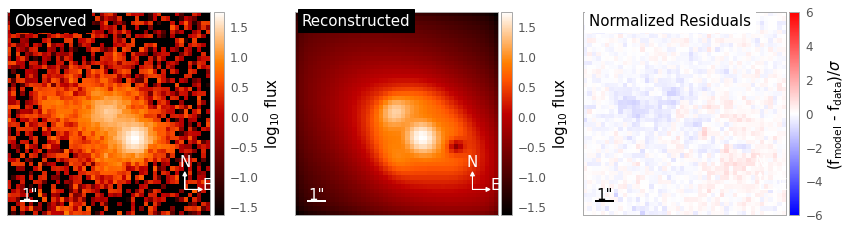

iteration of step 2 gave best reconstruction.
log likelihood before: -89.2986932616432 and log likelihood after: -85.38606747809769
iteration of step 0 gave best reconstruction.
log likelihood before: -886.613320302384 and log likelihood after: -886.613320302384
iteration of step 2 gave best reconstruction.
log likelihood before: -4814.384033977163 and log likelihood after: -4473.797659687125
-1.7157520628442364 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.08070516774867456
reduced chi^2 of data  1 =  0.8380088093595311
reduced chi^2 of data  2 =  4.228542211424504


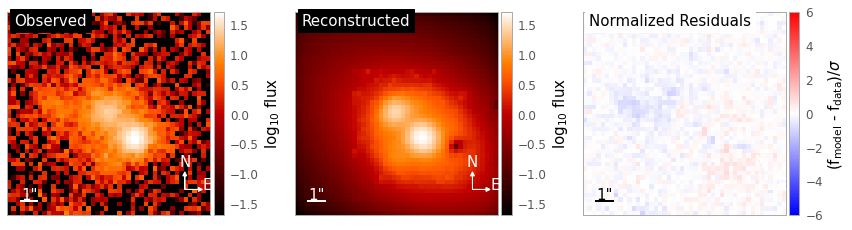

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
Max iteration reached! Stopping.
-1.4447962136560744 reduced X^2 of best position
-4559.776850298571 logL
6312 effective number of data points
[{'theta_E': 2.015238098784374, 'e1': -0.2018437843930505, 'e2': 0.19671426986638826, 'center_x': 1.0623472829575642, 'center_y': -1.395528380535964}] lens result
[{'amp': 1, 'R_sersic': 4.976686237209821, 'n_sersic': 2.9138709242878713, 'e1': 0.004616579437499184, 'e2': -0.2999714350875046, 'center_x': 1.4221721260142768, 'center_y': -1.3757966294015087}] source result
[{'amp': 1, 'R_sersic': 0.11658838932653419, 'n_sersic': 4.811431169627054, 'e1': 0.0069261778824525645, 'e2': -0.17898011623715782, 'center_x': 1.5601913959798586, 'center_y': -1.4426223118627506}] lens light result
[{'ra_image': array([-0.09196357,  0.03972108,  3.48906494]), 'dec_image': array([ 0.06929432, -2.59031932, -1.96068388]), 'point_amp': array([1., 1., 1.])}] point source res

100%|█████████████████████████████████████████| 800/800 [17:12<00:00,  1.29s/it]


Computing the MCMC...
Number of walkers =  210
Burn-in iterations:  200
Sampling iterations (in current run): 800
1034.2652978897095 time taken for MCMC sampling
-1.0605704871565673 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.07452679904908725
reduced chi^2 of data  1 =  0.4361792588038466
reduced chi^2 of data  2 =  2.6710054036167676


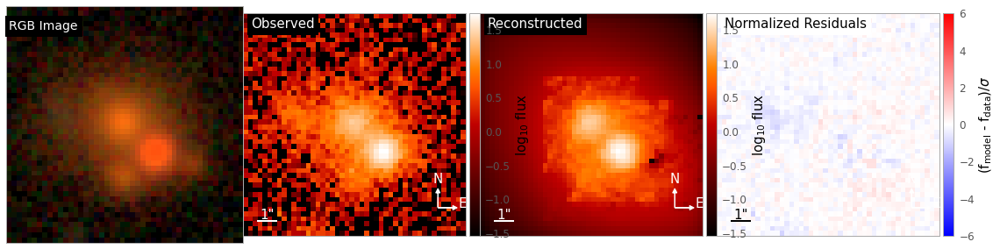

number of non-linear parameters in the MCMC process:  21
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_source_light0', 'n_sersic_source_light0', 'e1_source_light0', 'e2_source_light0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  126000
126000


Summary
Fixed parameters:
Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE 
From images: image data, fwhm, background noise, numPix & deltaPix, exposure time
Free Parameters: 
Lens: theta_E=2.07, e1=-0.22, e2=0.21, center_x=1.02, center_y=-1.46
Lens Light: amp=10016183.56, R_sersic=0.02, n_sersic=3.48, e1=-0.12, e2=-0.23, center_x=1.58, center_y=-1.45
Source Light: amp=36.04, R_sersic=4.91, n_sersic=2.77, e1=0.03, e2=-0.28, center_x=1.43, center_y=-1.43
Point Source Positions: x_images=[-0.08, 0.01, 3.56], y_images=[0.09, -2.66, -2.01]


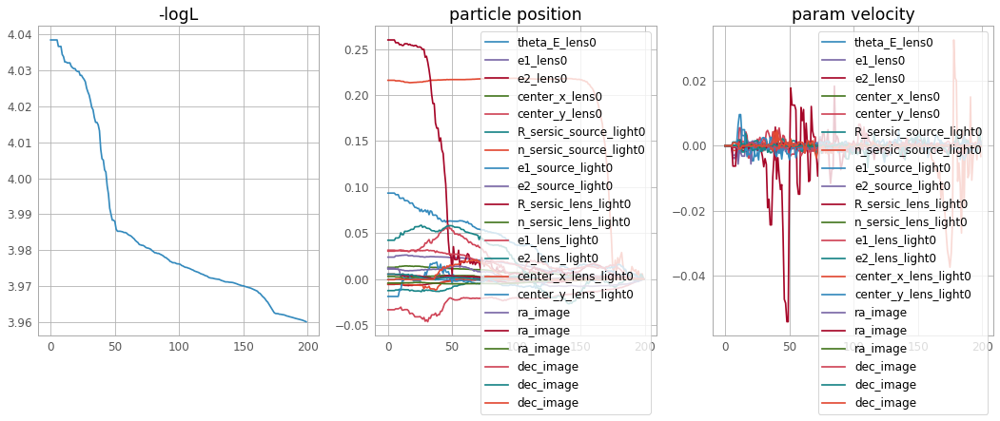

<Figure size 576x432 with 0 Axes>

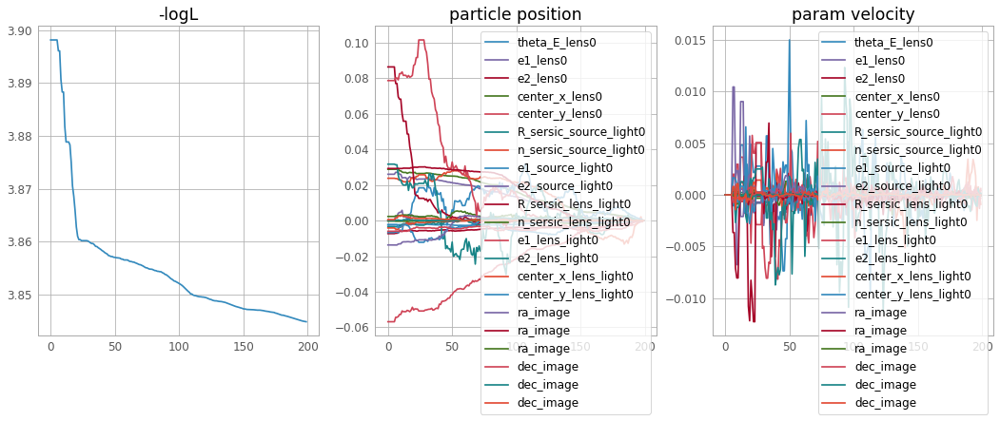

<Figure size 576x432 with 0 Axes>

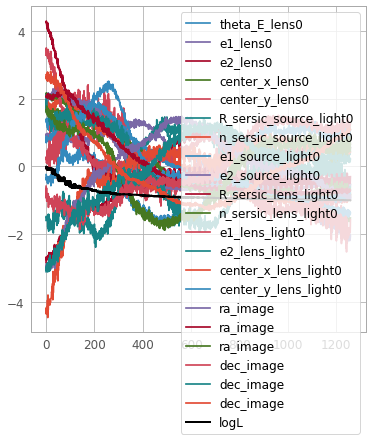

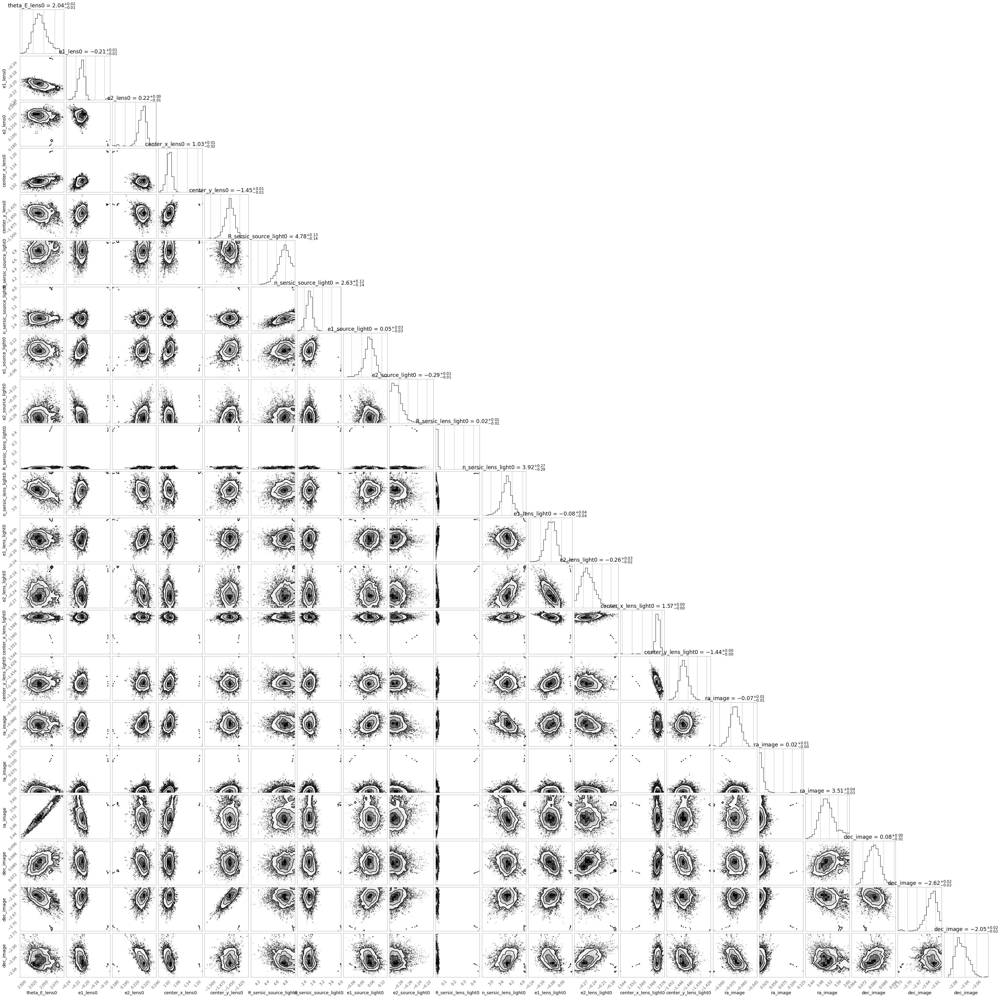

In [6]:
## DES_4414, coadd_id = 1087262176
# lens position:
center_x = 1.4
center_y = -1.6

# image positions:
x_images = [0.0,0.11,3.51]
y_images = [0.10,-2.69,-2.06]

# initial guesses for params
theta_E=approx_theta_E(center_x, center_y, x_images, y_images)
      
kwargs_lens_initial = {'theta_E': theta_E, 'e1': -0.05, 'e2': 0, 'center_x': center_x, 'center_y': center_y}
kwargs_source_initial = {'R_sersic': 1, 'n_sersic': 4, 'center_x': center_x, 'center_y': center_y, 'e1': 0.15, 'e2': -0.15}
kwargs_lens_light_initial= {'R_sersic': 1, 'n_sersic': 2, 'e1': 0, 'e2': 0, 'center_x': center_x, 'center_y': center_y}

# run model
model(coadd_id = 1087262176, 
      kwargs_lens_initial = kwargs_lens_initial, kwargs_source_initial = kwargs_source_initial, kwargs_lens_light_initial = kwargs_lens_light_initial,
      x_images = x_images, y_images = y_images, 
      mask_list=None
     )

'Estimated theta_E': 2.36


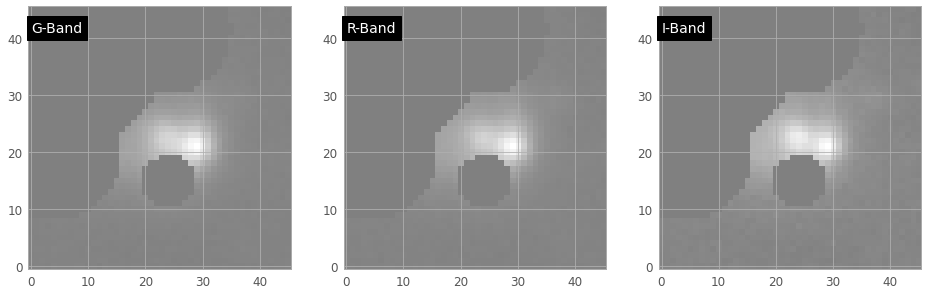

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
Max iteration reached! Stopping.
-10.168626598342449 reduced X^2 of best position
-32117.607110864625 logL
6317 effective number of data points
[{'theta_E': 2.1433000534596887, 'e1': 0.04430900136854157, 'e2': -0.12520056499866006, 'center_x': 1.776408663388722, 'center_y': -0.17706060011503813}] lens result
[{'amp': 1, 'R_sersic': 0.019591329905845535, 'n_sersic': 0.5028484235487635, 'e1': -0.2998914590904434, 'e2': -0.29945676699248575, 'center_x': 2.0436516796982813, 'center_y': -0.012806134727976135}] source result
[{'amp': 1, 'R_sersic': 2.578157031577354, 'n_sersic': 1.9322136062835868, 'e1': 0.11127854945811161, 'e2': 0.02324536281298093, 'center_x': 1.3830945174137612, 'center_y': -0.23343826357261155}] lens light result
[{'ra_image': array([ 3.60198536, -0.05762147]), 'dec_image': array([ 1.57078671, -0.08540867]), 'point_amp': array([1., 1.])}] point source result
{} special param res

100%|█████████████████████████████████████████| 800/800 [16:21<00:00,  1.23s/it]
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: invalid value encountered in log10
  log_model = np.log10(model)
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


Computing the MCMC...
Number of walkers =  190
Burn-in iterations:  200
Sampling iterations (in current run): 800
982.3142828941345 time taken for MCMC sampling
-9.945829158774629 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  6.149524966035571
reduced chi^2 of data  1 =  10.92727835490726
reduced chi^2 of data  2 =  12.760684155381055


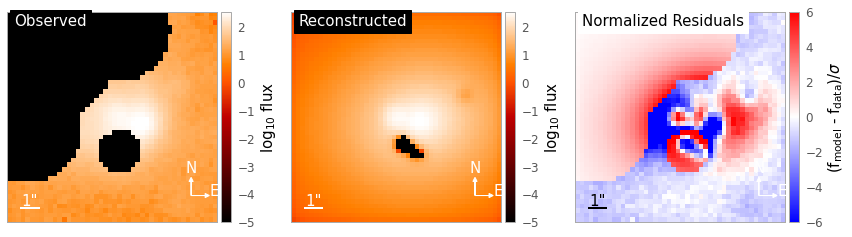

iteration of step 2 gave best reconstruction.
log likelihood before: -6506.197414065633 and log likelihood after: -6458.578650150168
iteration of step 3 gave best reconstruction.
log likelihood before: -11561.060499491881 and log likelihood after: -11127.75818069429
iteration of step 9 gave best reconstruction.
log likelihood before: -13500.803836393154 and log likelihood after: -11268.812561299026
-9.091099367405004 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  6.104516682561595
reduced chi^2 of data  1 =  10.517729849427496
reduced chi^2 of data  2 =  10.65105157022592


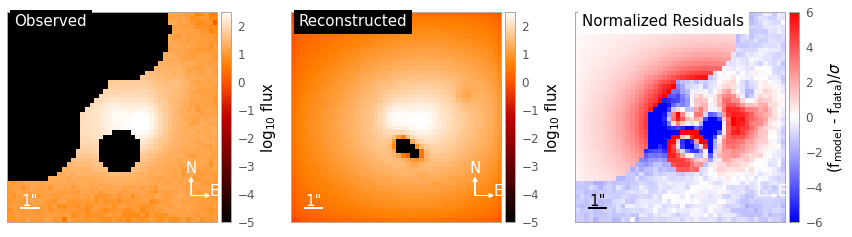

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
Max iteration reached! Stopping.
-8.585772075275989 reduced X^2 of best position
-27118.16109975921 logL
6317 effective number of data points
[{'theta_E': 2.1287248931218987, 'e1': 0.024210231678101678, 'e2': -0.12248681892376859, 'center_x': 1.7791169378193032, 'center_y': -0.15021117937041345}] lens result
[{'amp': 1, 'R_sersic': 0.014343019711411272, 'n_sersic': 0.5780764457638662, 'e1': -0.2999543941389607, 'e2': -0.2999106590729389, 'center_x': 2.031145324376516, 'center_y': 0.006627629792248634}] source result
[{'amp': 1, 'R_sersic': 2.989620396161676, 'n_sersic': 2.9081597775353196, 'e1': 0.09353080789440103, 'e2': 0.08920745999960827, 'center_x': 1.4444033275507104, 'center_y': -0.28572052671511966}] lens light result
[{'ra_image': array([ 3.64325341, -0.06999874]), 'dec_image': array([ 1.51014584, -0.03641498]), 'point_amp': array([1., 1.])}] point source result
{} special param result

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Workflow/psf_fitting.py:528: RuntimeWarning: divide by zero encountered in true_divide
  residual /= amp_i
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Workflow/psf_fitting.py:528: RuntimeWarning: invalid value encountered in true_divide
  residual /= amp_i


iteration of step 4 gave best reconstruction.
log likelihood before: -5949.2562855994665 and log likelihood after: -5184.7492269739405
iteration of step 4 gave best reconstruction.
log likelihood before: -10538.140072397633 and log likelihood after: -9045.296169042016
iteration of step 1 gave best reconstruction.
log likelihood before: -10627.902165978827 and log likelihood after: -10234.34899668307
Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
Max iteration reached! Stopping.
-7.369106248237656 reduced X^2 of best position
-23275.322085058637 logL
6317 effective number of data points
[{'theta_E': 2.125880284070562, 'e1': 0.02190000506439331, 'e2': -0.12420381528383305, 'center_x': 1.7773429967488652, 'center_y': -0.14918772873945738}] lens result
[{'amp': 1, 'R_sersic': 0.014591029788569345, 'n_sersic': 0.5760297726701293, 'e1': -0.29999252431340034, 'e2': -0.2997561757850245, 'center_x': 2.0296036948084937, 'center_y': 0.0105017399885166

100%|█████████████████████████████████████████| 800/800 [14:45<00:00,  1.11s/it]


Computing the MCMC...
Number of walkers =  190
Burn-in iterations:  200
Sampling iterations (in current run): 800
887.3019998073578 time taken for MCMC sampling
-7.153081230292315 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  4.1988152770676335
reduced chi^2 of data  1 =  7.741159594047178
reduced chi^2 of data  2 =  9.519268819762132


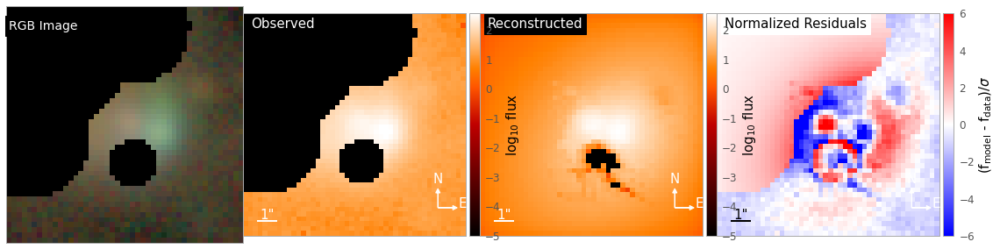

number of non-linear parameters in the MCMC process:  19
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_source_light0', 'n_sersic_source_light0', 'e1_source_light0', 'e2_source_light0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  114000
114000


Summary
Fixed parameters:
Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE 
From images: image data, fwhm, background noise, numPix & deltaPix, exposure time
Free Parameters: 
Lens: theta_E=2.06, e1=-0.01, e2=-0.23, center_x=1.59, center_y=-0.2
Lens Light: amp=372.01, R_sersic=3.31, n_sersic=3.26, e1=0.03, e2=0.17, center_x=1.47, center_y=-0.36
Source Light: amp=-247466.13, R_sersic=0.03, n_sersic=1.4, e1=-0.3, e2=-0.29, center_x=1.97, center_y=0.09
Point Source Positions: x_images=[3.6, -0.07], y_images=[1.54, -0.08]


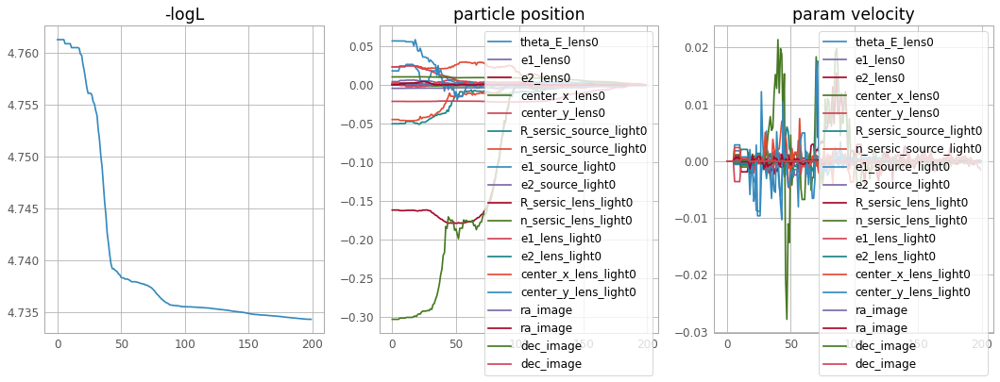

<Figure size 576x432 with 0 Axes>

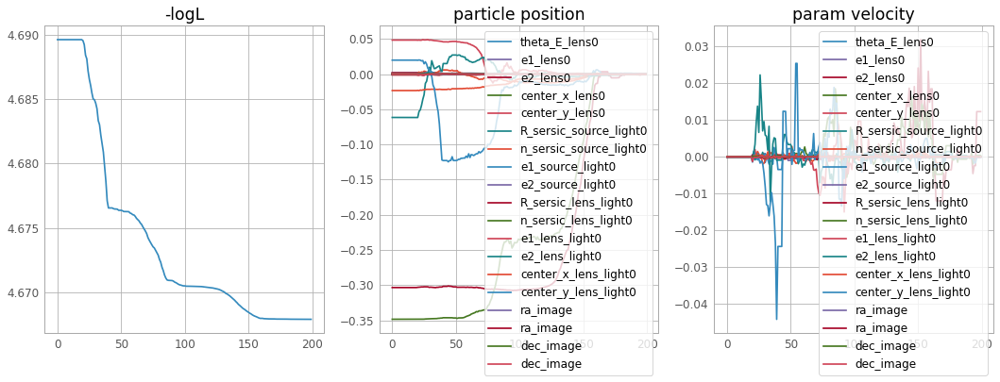

<Figure size 576x432 with 0 Axes>

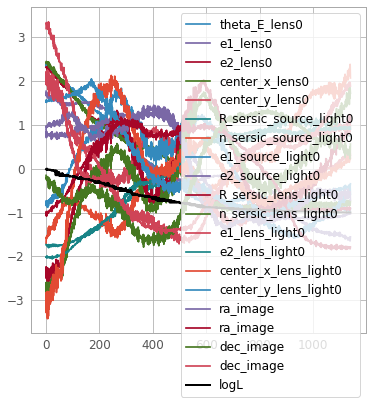

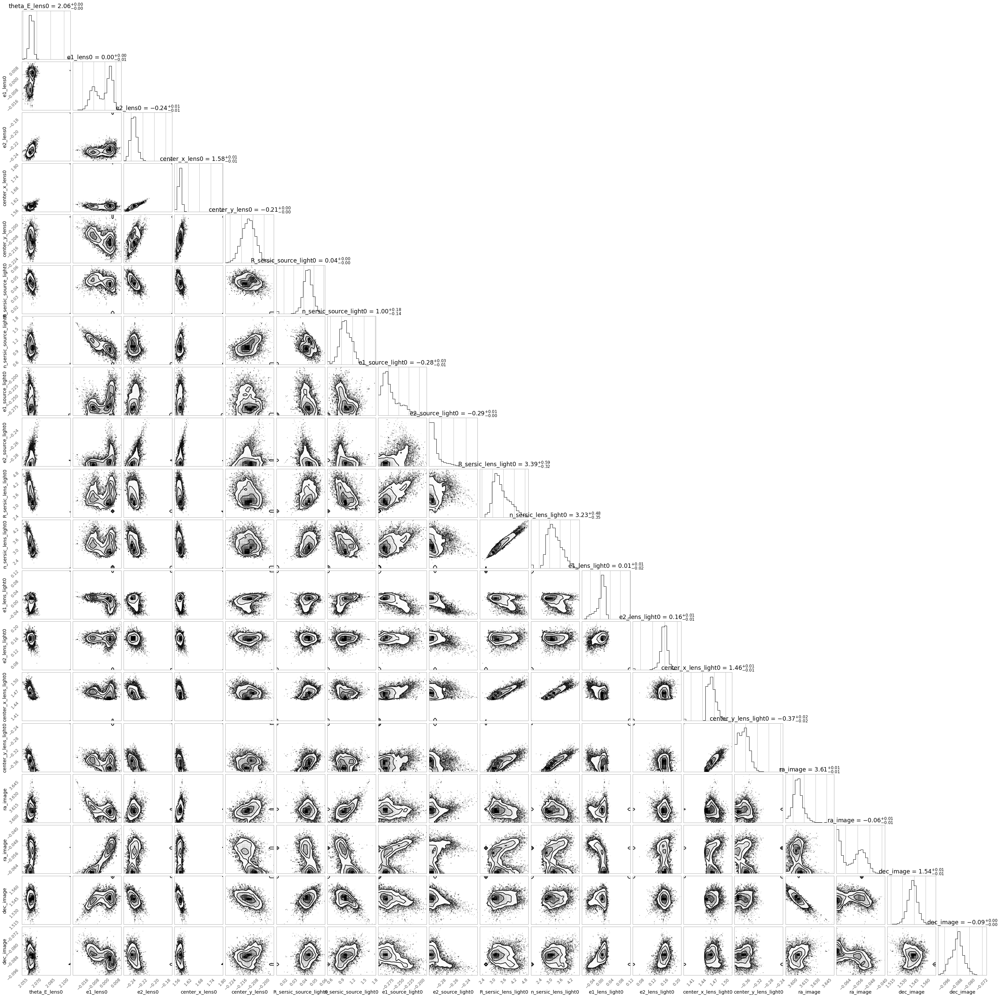

In [7]:
## DES_0041, coadd_id = 1325853948
center_x = 1.6
center_y = -0.6

x_images = [3.69,0.03]
y_images = [1.61,0.0]

theta_E=approx_theta_E(center_x, center_y, x_images, y_images)
kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0.2, 'e2': 0, 'center_x': center_x, 'center_y': center_y}
kwargs_source_initial = {'R_sersic': 1, 'n_sersic': 3, 'center_x': center_x, 'center_y': center_y, 'e1': -0.1, 'e2': 0.1}
kwargs_lens_light_initial= {'R_sersic': 1, 'n_sersic': 2, 'e1': 0, 'e2': 0, 'center_x': center_x, 'center_y': center_y}

model(coadd_id = 1325853948, 
      kwargs_lens_initial = kwargs_lens_initial, kwargs_source_initial=kwargs_source_initial, kwargs_lens_light_initial = kwargs_lens_light_initial,
      x_images = x_images, y_images = y_images,
      mask_list = [{'mask_center_x': 0.4, 'mask_center_y': -2, 'mask_radius': 1.2}, 
                   {'mask_center_x': -5, 'mask_center_y': 5, 'mask_radius': 5.7}, 
                   {'mask_center_x': 0.3, 'mask_center_y': 5, 'mask_radius': 3},
                   {'mask_center_x': -4.8, 'mask_center_y': -0.8, 'mask_radius': 3}])

'Estimated theta_E': 1.68


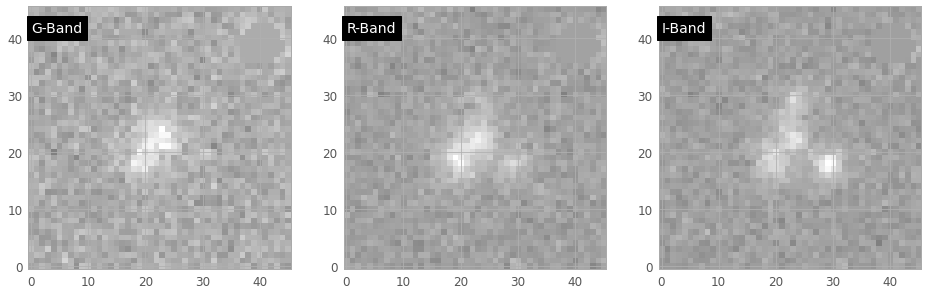

Computing the PSO ...
10
20
Max iteration reached! Stopping.
-1.219323675779223 reduced X^2 of best position
-3848.1855207592275 logL
6312 effective number of data points
[{'theta_E': 1.676657534979192, 'e1': 0.19704813553187148, 'e2': 0.19233702413940387, 'center_x': 0.11085977175982492, 'center_y': -0.4609259576245299}] lens result
[{'amp': 1, 'R_sersic': 0.5408845949407725, 'n_sersic': 2.5676309109033024, 'e1': -0.04451708467454796, 'e2': 0.08627192632554245, 'center_x': 0.25246639340507265, 'center_y': -0.21853008053422576}] source result
[{'amp': 1, 'R_sersic': 1.3770202823852522, 'n_sersic': 2.040965027630104, 'e1': -0.08227451745724321, 'e2': -0.00578317215798637, 'center_x': -0.0860747386980485, 'center_y': -0.3595219949077325}] lens light result
[{'ra_image': array([-0.04118581, -0.94291267,  1.58871302]), 'dec_image': array([ 1.5358314 , -1.14207004, -1.30716219]), 'point_amp': array([1., 1., 1.])}] point source result
{} special param result
2.72609806060791 time used for  P

100%|███████████████████████████████████████████| 80/80 [02:08<00:00,  1.60s/it]
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


Computing the MCMC...
Number of walkers =  210
Burn-in iterations:  20
Sampling iterations (in current run): 80
129.49476408958435 time taken for MCMC sampling
-0.18086211693210083 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.06462506345630858
reduced chi^2 of data  1 =  0.10181188685571911
reduced chi^2 of data  2 =  0.37614940048427487


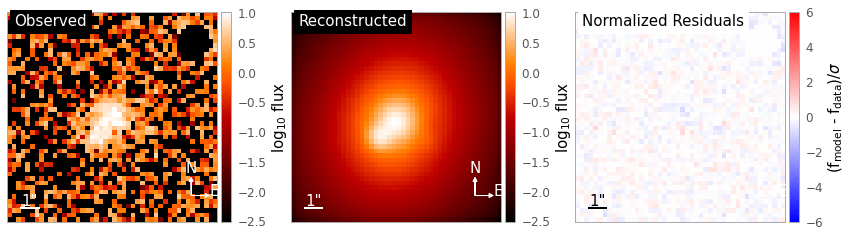

iteration of step 0 gave best reconstruction.
log likelihood before: -68.37331713677449 and log likelihood after: -68.37331713677449
iteration of step 10 gave best reconstruction.
log likelihood before: -107.71697629335083 and log likelihood after: -105.254827633079
iteration of step 17 gave best reconstruction.
log likelihood before: -397.96606571236276 and log likelihood after: -384.84813588760017
-0.17595345956441516 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.06462506345630858
reduced chi^2 of data  1 =  0.09948471420895937
reduced chi^2 of data  2 =  0.36375060102797746


/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: invalid value encountered in log10
  log_model = np.log10(model)


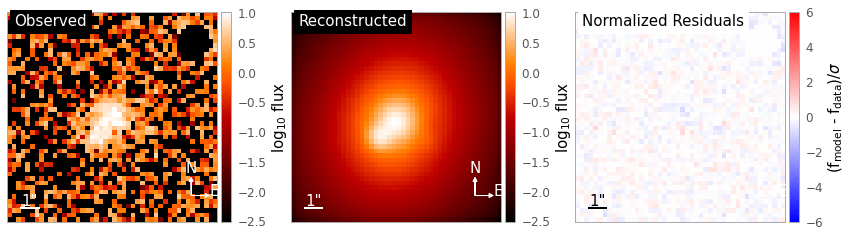

Computing the PSO ...
10
20
Max iteration reached! Stopping.
-0.1771029874907154 reduced X^2 of best position
-558.9370285206978 logL
6312 effective number of data points
[{'theta_E': 1.6838962639732307, 'e1': 0.18296504303129138, 'e2': 0.18566479864882923, 'center_x': 0.13722286790799068, 'center_y': -0.44556624940117845}] lens result
[{'amp': 1, 'R_sersic': 0.5444973366793532, 'n_sersic': 2.547995692928037, 'e1': -0.052363689706913054, 'e2': 0.07204063059802476, 'center_x': 0.26429229664586745, 'center_y': -0.2141300026695645}] source result
[{'amp': 1, 'R_sersic': 1.3811548978815003, 'n_sersic': 2.010193850993978, 'e1': -0.06990179543147315, 'e2': 0.05638444234330985, 'center_x': -0.06614519040692034, 'center_y': -0.33260335756101966}] lens light result
[{'ra_image': array([-0.0444169 , -0.93429121,  1.59322779]), 'dec_image': array([ 1.53666643, -1.14843874, -1.30671524]), 'point_amp': array([1., 1., 1.])}] point source result
{} special param result
3.826054096221924 time used for

100%|███████████████████████████████████████████| 80/80 [02:19<00:00,  1.75s/it]


Computing the MCMC...
Number of walkers =  210
Burn-in iterations:  20
Sampling iterations (in current run): 80
141.38146805763245 time taken for MCMC sampling
-0.16509005848700253 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.0643570981839847
reduced chi^2 of data  1 =  0.09681973396851142
reduced chi^2 of data  2 =  0.3340933433085115


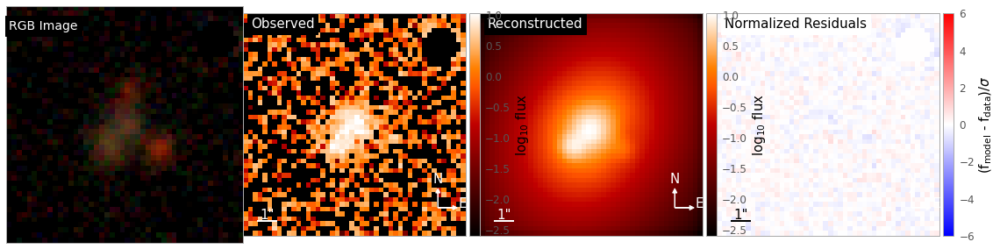

number of non-linear parameters in the MCMC process:  21
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_source_light0', 'n_sersic_source_light0', 'e1_source_light0', 'e2_source_light0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  12600
12600
Summary
Fixed parameters:
Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE 
From images: image data, fwhm, background noise, numPix & deltaPix, exposure time
Free Parameters: 
Lens: theta_E=1.69, e1=0.18, e2=0.19, center_x=0.13, center_y=-0.44
Lens Light: amp=77.16, R_sersic=1.37, n_sersic=2.03, e1=-0.06, e2=0.09, center_x=-0.08, center_y=-0.31
Source Light: amp=-55.34, R_sersic=0.58, n_sersic=2.6, e1=-0.02, e2=0.06, center_x=0.26, 

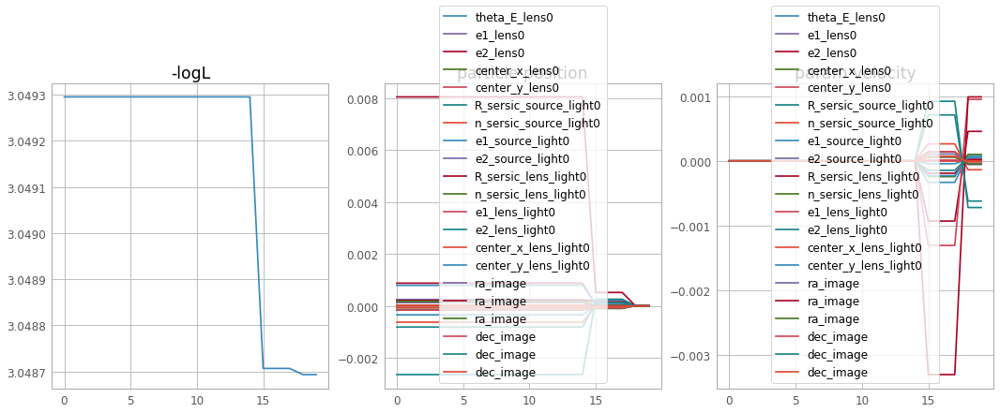

<Figure size 576x432 with 0 Axes>

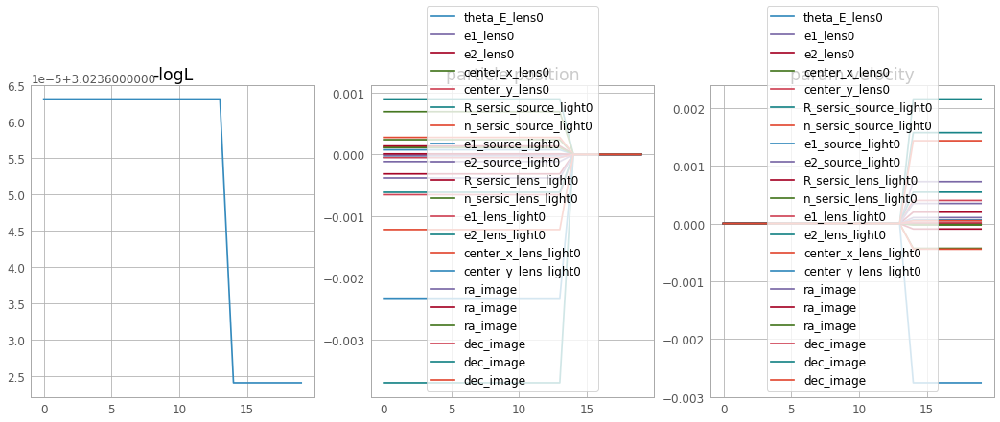

<Figure size 576x432 with 0 Axes>

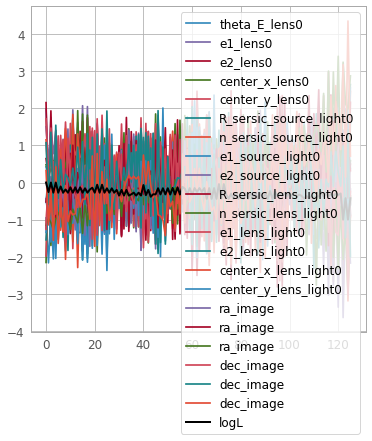

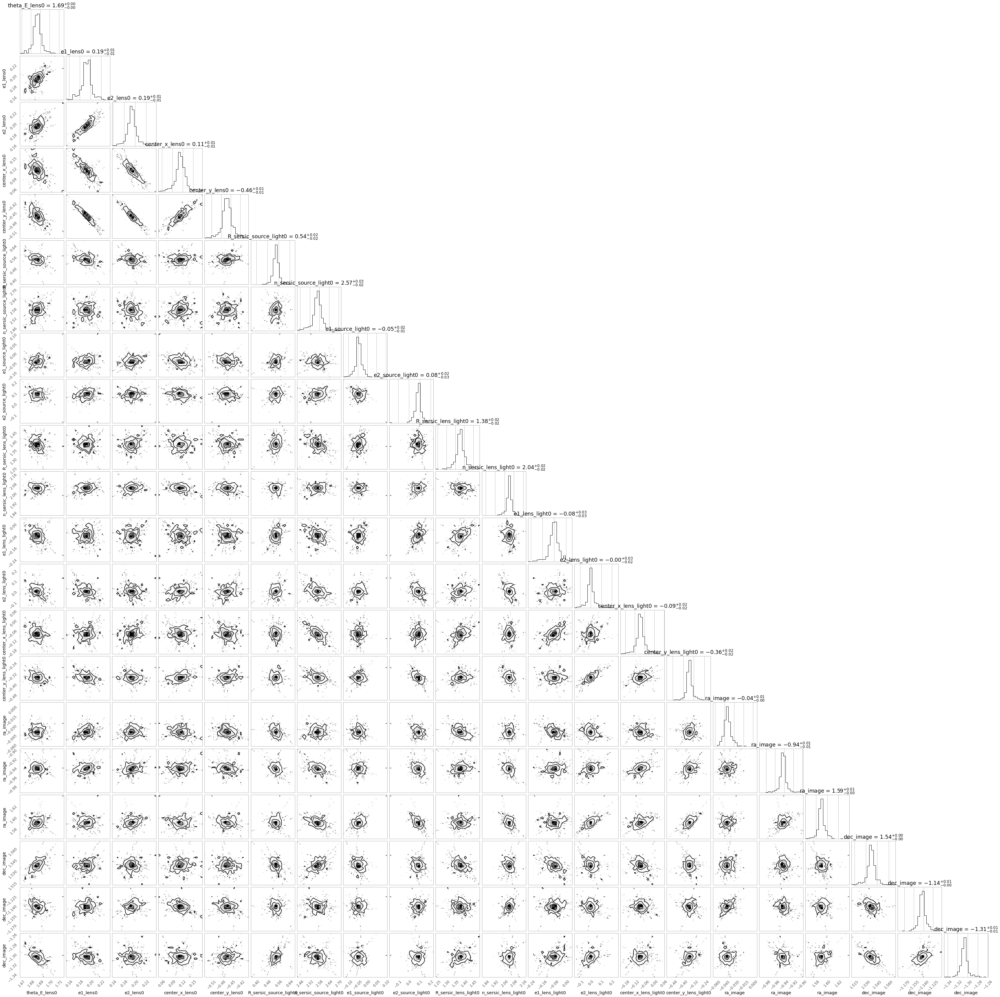

In [9]:
## DES_2915, coadd_id = 1400263522

# image positions
x_images = [-0.06,-0.99,1.57]
y_images = [1.56,-1.21,-1.25]

# lens position
center_x = 0
center_y = -0.25

# initial guesses for params
theta_E=approx_theta_E(center_x, center_y, x_images, y_images)

kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0.15, 'e2': 0.1, 'center_x': center_x , 'center_y': center_y}
kwargs_source_initial = {'R_sersic': 1, 'n_sersic': 2.5, 'center_x': center_x, 'center_y': center_y, 'e1': 0.1, 'e2': 0.}
kwargs_lens_light_initial= {'R_sersic': 1, 'n_sersic': 2, 'e1': -0.15, 'e2': 0.0, 'center_x': center_x , 'center_y': center_y}

# run model
model(coadd_id = 1400263522, kwargs_lens_initial = kwargs_lens_initial, kwargs_source_initial=kwargs_source_initial, kwargs_lens_light_initial = kwargs_lens_light_initial,
      x_images = x_images, y_images = y_images,
      mask_list = [{'mask_center_x': 4.7, 'mask_center_y': 4.3, 'mask_radius': 1}]
     )


